<a href="https://colab.research.google.com/github/ACTCollaboration/DR6_Notebooks/blob/main/ACT_DR6_ymap_stacking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Visualizing and stacking galaxy clusters in the ACT DR6 Compton $y$ map**


*Written by Martine Lokken and the ACT collaboration*


**1. Data: y map**

The DR6 y map is presented in Coulton et al. 2023, [on arXiv](https://https://arxiv.org/abs/2307.01258).
The map, beam, and mask are available on [LAMBDA](https://lambda.gsfc.nasa.gov/product/act/actadv_dr6_compton_maps_get.html).


The map is ~13,000 square degrees of combined data from ACT and Planck, using a needlet internal linear combination (ILC) technique adept at minimizing Galactic contamination and handling spatially-varying noise. The map power spectrum is noise-dominated at nearly all scales but improves upon the Planck-only y map noise at all scales. Nevertheless, many massive galaxy clusters are visible by-eye. Less massive clusters need to be stacked to be distinguishable from the noise. This notebook shows how to take cutouts of the map around clusters and stack them.


The y map used in this notebook is the standard map from the data release, with the following properties:
*   No deprojected components (likely to have some CIB and CMB contamination)
*   1.6' effective beam
*   0.5' pixels

There are many related maps and products available at [this url](https://portal.nersc.gov/project/act/dr6_nilc/ymaps_20230220/). This includes a suite of CIB-deprojected maps. The effects in these maps and suggestions for how to incorporate them into your analysis are described in a companion notebook, called ACT_DR6_ymap_CIB.

See the [DR4/5 notebooks](https://github.com/ACTCollaboration/DR4_DR5_Notebooks/blob/master/Notebooks/Section_5_Lensing_maps.ipynb) for more examples of manipulating ACT data.

In [ ]:
# Option 1: Run this notebook with the full maps
!wget -c -O ilc_actplanck_ymap.fits https://phy-act1.princeton.edu/public/data/dr6_ilc_v1/ilc_SZ_yy.fits # get the file and rename it for consistency with the filenames on Lambda
!wget -c -O wide_mask_GAL070_apod_1.50_deg_wExtended.fits https://phy-act1.princeton.edu/public/data/dr6_ilc_v1/wide_mask_GAL070_apod_1.50_deg_wExtended.fits

# Option 2: Run this notebook with downgraded maps (will take less RAM in Collab) -- uncomment the following lines
# !wget -c -O ilc_actplanck_ymap.fits https://phy-act1.princeton.edu/public/data/dr6_ilc_v1/downgraded10_ilc_SZ_yy.fits # get the file and rename it for consistency with the filenames on Lambda
# !wget -c -O wide_mask_GAL070_apod_1.50_deg_wExtended.fits https://phy-act1.princeton.edu/public/data/dr6_ilc_v1/downgraded10_outputMask_wide_mask_GAL070_apod_1.50_deg_wExtended.fits

# Option 3:
# Go to LAMBDA, https://lambda.gsfc.nasa.gov/product/act/actadv_dr6_compton_maps_get.html
# Download ilc_actplanck_ymap.fits and wide_mask_GAL070_apod_1.50_deg_wExtended.fits to your computer
# After downloading, go to Files --> Upload on the left side of Colab, and upload the files to this working session

# Option 4:
# Add the Option 3 files to your Google Drive, then uncomment and run the following lines:
# from google.colab import drive
# drive.mount('/content/drive')


--2024-03-21 20:25:28--  https://phy-act1.princeton.edu/public/data/dr6_ilc_v1/ilc_SZ_yy.fits
Resolving phy-act1.princeton.edu (phy-act1.princeton.edu)... 128.112.102.238
Connecting to phy-act1.princeton.edu (phy-act1.princeton.edu)|128.112.102.238|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

--2024-03-21 20:25:29--  https://phy-act1.princeton.edu/public/data/dr6_ilc_v1/wide_mask_GAL070_apod_1.50_deg_wExtended.fits
Resolving phy-act1.princeton.edu (phy-act1.princeton.edu)... 128.112.102.238
Connecting to phy-act1.princeton.edu (phy-act1.princeton.edu)|128.112.102.238|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1783298880 (1.7G) [image/fits]
Saving to: ‘wide_mask_GAL070_apod_1.50_deg_wExtended.fits’

wide_mask_GAL070_ap 100%[===================>]   1.66G  41.1MB/s    in 43s     

2024-03-21 20:26:12 (39.8 MB/s) - ‘wide_mask_GAL070_apod_1.50_deg_wExten

**2. Loading the Data Product**
The next section reads in the y map. To do so, we need to install and import the `pixell` package.

These [pixell tutorials](https://github.com/simonsobs/pixell_tutorials) provide further examples of map manipulation with `pixell`.

In [ ]:
# Install pixell
!pip install pixell
# later on, we will also use pillow for some image manipulation
!pip install pillow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.6/10.6 MB 25.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 48.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 33.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 57.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.3/213.3 kB 18.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 21.8 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of coverage[toml] to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 234.1/234.1 kB 21.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 234.0/234.0 kB 24.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 234.0/234.0 kB 23.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.2/233.2 kB 20.3 MB/s et

In [ ]:
# Import some neccesary packages
from pixell import enmap, enplot, utils
from astropy.io import fits
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick


In [ ]:
# gdrive_path = "/content/drive/MyDrive/path_to_maps/" # only needed if you are loading the maps in from your Google Drive

# load the ymap as an 'enmap'
ymap = enmap.read_map("ilc_SZ_yy.fits") # put gdrive_path + "ilc"

# Load the mask
# Actual DR6 mask, uncomment later: mask = enmap.read_map("")
mask = enmap.read_map("wide_mask_GAL070_apod_1.50_deg_wExtended.fits")

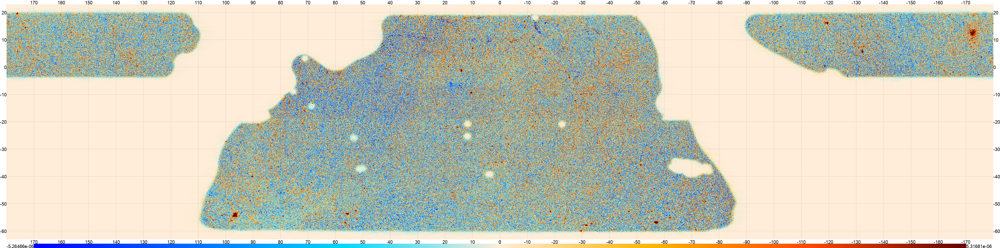

In [ ]:
# Define a function to plot the map
def eshow(x,**kwargs):
    ''' Define a function to help us plot the maps neatly '''
    plots = enplot.get_plots(x, **kwargs)
    enplot.show(plots, method = "ipython")
# show the map (downgraded to save time and memory)
eshow(ymap, downgrade=10, ticks=10, colorbar=True)

Now, let's get a publicly-available cluster list and take a look at a few clusters in our map area.

In [ ]:
# Load in a small list of clusters with redshifts from public data (DES SVA, see e.g. https://arxiv.org/pdf/1601.00621.pdf)
!wget -O redmapper_y1a1_public_v6.4_catalog.fits.gz https://desdr-server.ncsa.illinois.edu/despublic/y1a1_files/redmapper/redmapper_y1a1_public_v6.4_catalog.fits.gz
hdu = fits.open("redmapper_y1a1_public_v6.4_catalog.fits.gz")
clusters = hdu[1].data
hdu.close()

# let's just look at massive, low-z clusters for now: these are easy to see in the y map
richness = clusters['LAMBDA']
z  = clusters['Z_LAMBDA']
min_rich = 20
rich     = richness>min_rich
maxz     = 0.5
zrange   = z < maxz
keep     = rich & zrange

# cut the clusters to those within the chosen richness and redshift range
richness = richness[keep]
ra = clusters['RA'][keep]
dec = clusters['DEC'][keep]
z = z[keep]
ncl = len(ra)
print("Number of clusters:", ncl)

--2024-03-21 20:29:04--  https://desdr-server.ncsa.illinois.edu/despublic/y1a1_files/redmapper/redmapper_y1a1_public_v6.4_catalog.fits.gz
Resolving desdr-server.ncsa.illinois.edu (desdr-server.ncsa.illinois.edu)... 149.165.153.121
Connecting to desdr-server.ncsa.illinois.edu (desdr-server.ncsa.illinois.edu)|149.165.153.121|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2157326 (2.1M) [application/gzip]
Saving to: ‘redmapper_y1a1_public_v6.4_catalog.fits.gz’

redmapper_y1a1_publ 100%[===================>]   2.06M  5.43MB/s    in 0.4s    

2024-03-21 20:29:05 (5.43 MB/s) - ‘redmapper_y1a1_public_v6.4_catalog.fits.gz’ saved [2157326/2157326]

Number of clusters: 3908


In [ ]:
# Define a function to show on the map where the clusters are:
def mask_srcs(shape,wcs,srcs_deg,radius_arcmin):
    """
    from orphics.maps by Mathew S. Madhavacheril
    Create a mask of circular holes in rectangular pixelization given
    a set of coordinates and a hole radius.

    Parameters
    ----------
    shape : tuple
        Shape of the output mask to be generated.
    wcs : `astropy.wcs.WCS`
        WCS object describing the output mask.
    srcs_deg : float `numpy.ndarray` of shape (2, Nobj)
        An array of Nobj coordinates in (Dec,RA) order and in degrees.
    radius_arcmin : float
        The radius of the circular hole to mask with zeros at each
        object location.

    Returns
    -------
    mask : `pixell.enmap.ndmap`
        A boolean pixell enmap with geometry (shape,wcs) and False
        inside the circular holes and True outside.

    """
    r = np.deg2rad(radius_arcmin/60.)
    return enmap.distance_from(shape,wcs,np.deg2rad(srcs_deg), rmax=r) >= r

In [ ]:
cluster_visual = mask_srcs(mask.shape,mask.wcs,np.asarray((dec,ra)),10.)

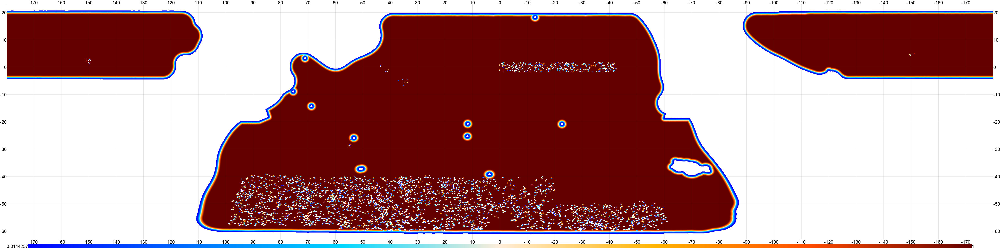

In [ ]:
# show the clusters and where they are in relation to the ACT y mask
eshow(cluster_visual*mask, downgrade = 10, ticks=10, colorbar=True, mask = 0)


**Find out if our objects are near the edge of the y mask**

From the above image we can see that some clusters lie very close to the mask edges. We may not want to include cutouts centered on objects near the edge of the mask, as the outskirts will include unphysical structure (or lack thereof)

In [ ]:
# limit clusters to no closer than 2 degrees from the mask edges
include_idx = np.arange(ncl)
cls_overlap = []
height,width = enmap.pixshape(mask.shape,mask.wcs) #height and width of pixels in radians
print(height,width)
npix_from_edge_x = np.deg2rad(2)//width # remove 2 degrees from the edge of mask
npix_from_edge_y = np.deg2rad(2)//height # remove 2 degrees from the edge of mask
print("Avoiding this many pixels from the mask edges / holes (x,y):", npix_from_edge_x, npix_from_edge_y)
for i_cl in range(ncl):
    coords = np.deg2rad(np.array((dec[i_cl],ra[i_cl])))
    ypix, xpix = enmap.sky2pix(mask.shape, mask.wcs, coords)
    left   = int(xpix - npix_from_edge_x)
    right  = int(xpix + npix_from_edge_x + 1)
    bottom = int(ypix - npix_from_edge_y)
    top    = int(ypix + npix_from_edge_y + 1)
    # Make a box of the mask values in the cutout around the cluster
    maski = mask[bottom:top, left:right]
    # check if the mean is low enough to indicate this is near the edge
    if maski.size == 0:
        mean = 0.
    else:
        mean = np.mean(maski)
    if mean<1: # this number can be fiddled with to get further or closer to the edges
        continue
    else:
        cls_overlap.append(include_idx[i_cl])

richness_masked=richness[cls_overlap]
ra_masked=ra[cls_overlap]
dec_masked=dec[cls_overlap]
z_masked=z[cls_overlap]
print("Number of clusters remaining:", len(z_masked))

0.00014544410433286022 0.00012419609722938644
Avoiding this many pixels from the mask edges / holes (x,y): 281.0 240.0
Number of clusters remaining: 3429


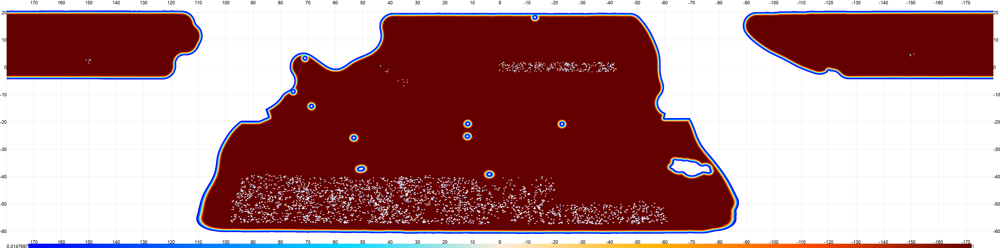

In [ ]:
# plot the cluster locations after removing clusters near the edge
cluster_visual_masked = mask_srcs(mask.shape,mask.wcs,np.asarray((dec_masked,ra_masked)),10.)
eshow(cluster_visual_masked * mask, downgrade = 10, ticks=10, colorbar=True, mask = 0)

We see that the cluster locations are now well within the mask boundaries.

**Take cutouts around some clusters**

Let's look at a few of the clusters. Those which are both high-richness and at low redshifts are more visible in the map.

-54.500456


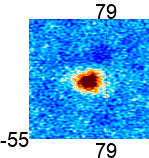

area in steradians 0.00017687195599944123
Size in pixels: 14400
Richness of this cluster:  195.06956
Redshift of this cluster:  0.30416065
-48.327672


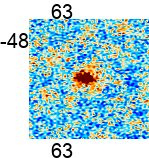

area in steradians 0.00020252237861743413
Size in pixels: 14400
Richness of this cluster:  174.4601
Redshift of this cluster:  0.41936922
-53.029288


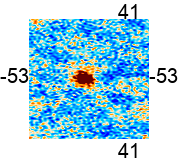

area in steradians 0.00018316175023896396
Size in pixels: 14400
Richness of this cluster:  146.2384
Redshift of this cluster:  0.30112934
-44.518403


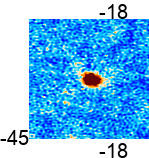

area in steradians 0.00021718810633521344
Size in pixels: 14400
Richness of this cluster:  178.83827
Redshift of this cluster:  0.3514858
-44.130646999999996


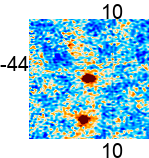

area in steradians 0.00021861221305316398
Size in pixels: 14400
Richness of this cluster:  139.17534
Redshift of this cluster:  0.3678793
1.406318


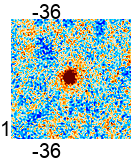

area in steradians 0.0003045220811892312
Size in pixels: 14400
Richness of this cluster:  135.48364
Redshift of this cluster:  0.24008219
1.390947


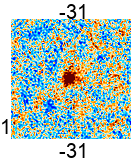

area in steradians 0.0003045242396457859
Size in pixels: 14400
Richness of this cluster:  136.20062
Redshift of this cluster:  0.22623187
-1.04959


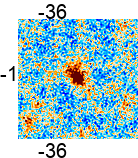

area in steradians 0.0003045619973523125
Size in pixels: 14400
Richness of this cluster:  141.08221
Redshift of this cluster:  0.32642642
-49.26623


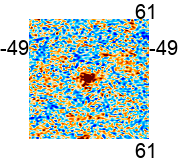

area in steradians 0.00019875554625960255
Size in pixels: 14400
Richness of this cluster:  140.34998
Redshift of this cluster:  0.29782504
0.27141899999999997


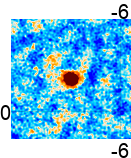

area in steradians 0.00030461015035663375
Size in pixels: 14400
Richness of this cluster:  129.00027
Redshift of this cluster:  0.27770245


In [ ]:
# view a couple cutouts around clusters with the same area in steradians
# see notebook Pixell_map_manipulation for more details
# First we need to define our coordinates and radius in radians (utils.degree converts degrees to radians)

# Note that to actually keep the angular separation constant across all maps, we will later want to
# multiply the radius_ra by * np.cos(dec_i) to account for narrowing ra with off-equator declination
# However, let us start with this oversimplified example as it keeps a consistent cutout size in pixel space

patch_size = 1 # degree
patches = []
Ncl_stack = 10
for i in range(Ncl_stack):
  ra_i = ra_masked[i]*utils.degree # to radians
  dec_i = dec_masked[i] * utils.degree
  radius_ra  = patch_size/2. * utils.degree
  radius_dec = patch_size/2. * utils.degree
  # Next we create our submap by defining a box in coordinate space
  imap_sub = ymap.submap([[dec_i - radius_dec, ra_i - radius_ra], [dec_i + radius_dec, ra_i + radius_ra]])
  print(np.rad2deg(dec_i))
  # Visualize the map cutout
  plot = enplot.plot(imap_sub)
  enplot.show(plot)
  patches.append(imap_sub)
  # check the area in steradians of of the submapprint(imap.shape, imap.wcs)
  print("area in steradians", enmap.area(imap_sub.shape, imap_sub.wcs))
  print("Size in pixels:", imap_sub.size)
  print("Richness of this cluster: ", richness_masked[i])
  print("Redshift of this cluster: ", z_masked[i])

You may notice that the low-dec objects appear more stretched horizontally; this is becaue we haven't yet accounted for the cos(dec) effect. CAR is equal-area and equal-shape such that stucture near the poles gets quite distorted, but the patch size in pixels is always equal for a consistent ra range.

**3. Example Stacking**

Stack ten clusters, plot the profile of the stacked image, and measure the improvements in signal-to-noise

In [ ]:
# make the stack by a simple average (a more complex analysis might use signal-to-noise weighting)
stack = np.average(patches, axis=0)

Text(0.5, 1.0, 'Cluster stack without rescaling')

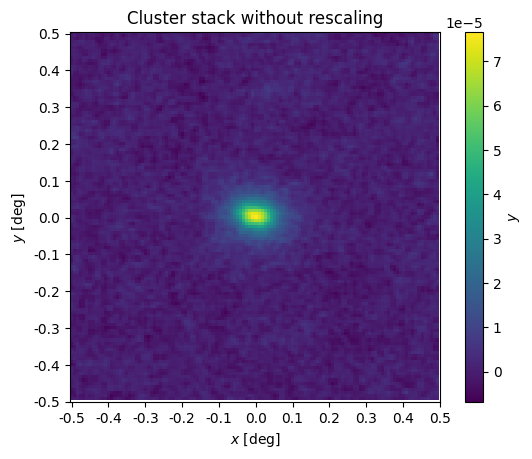

In [ ]:
# show the stacked figure
fig, ax = plt.subplots()
ystack = ax.imshow(stack)
nticks = 11

ax.set_xticks(np.linspace(0, stack.shape[1],nticks))
ax.set_yticks(np.linspace(0, stack.shape[0],nticks))
ax.set_xticklabels("{:.1f}".format(tick) for tick in np.linspace(-patch_size/2., patch_size/2., nticks))
ax.set_yticklabels("{:.1f}".format(tick) for tick in np.linspace(patch_size/2., -patch_size/2., nticks))
ax.set_xlabel("$x$ [deg]")
ax.set_ylabel("$y$ [deg]")
plt.colorbar(ystack, label='$y$')
plt.title("Cluster stack without rescaling")

***4. The stacked clusters in the above image appear squashed because of neglecting to deal with the sky geometry. We will include that in the following section. ***

Here we demonstrate how to rescale images and stack cutouts of equal angular sky separation in RA and Dec

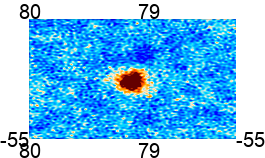

area in steradians 0.0003051041240990361
Size in pixels: 24840


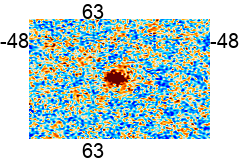

area in steradians 0.00030547125441462975
Size in pixels: 21720


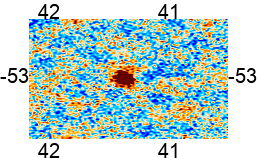

area in steradians 0.0003037432358129486
Size in pixels: 23880


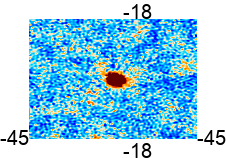

area in steradians 0.00030406334886929877
Size in pixels: 20160


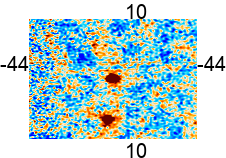

area in steradians 0.0003060570982744296
Size in pixels: 20160


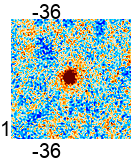

area in steradians 0.0003045220811892312
Size in pixels: 14400


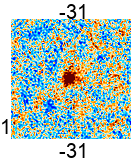

area in steradians 0.0003045242396457859
Size in pixels: 14400


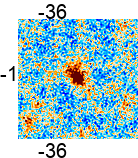

area in steradians 0.0003045619973523125
Size in pixels: 14400


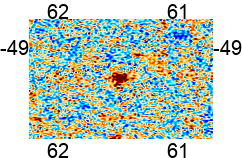

area in steradians 0.0003047585042647239
Size in pixels: 22080


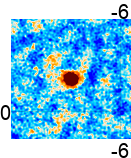

area in steradians 0.00030461015035663375
Size in pixels: 14400


In [ ]:
# we will save our patches here
patches_1x1deg = []

Ncl_stack = 10 # stack only 10 clusters; increase this number if you want to stack more

for i in range(Ncl_stack):
  ra_i = ra_masked[i]*utils.degree # to radians
  dec_i = dec_masked[i] * utils.degree
  radius_ra  = patch_size/2. * utils.degree / np.cos(dec_i) # account for narrowing ra with off-equator declination
  radius_dec = patch_size/2. * utils.degree
  # Next we create our submap by defining a box in coordinate space
  imap_sub = ymap.submap([[dec_i - radius_dec, ra_i - radius_ra], [dec_i + radius_dec, ra_i + radius_ra]])
  # Visualize the map cutout
  plot = enplot.plot(imap_sub)
  enplot.show(plot)
  patches_1x1deg.append(imap_sub)
  # check the area in steradians of of the submap
  print("area in steradians", enmap.area(imap_sub.shape, imap_sub.wcs))
  print("Size in pixels:", imap_sub.size)


The patches are all different sizes in pixels now, but have a more consistent area in steradians. Given the pixel-size differences, now we need to do some rescaling.

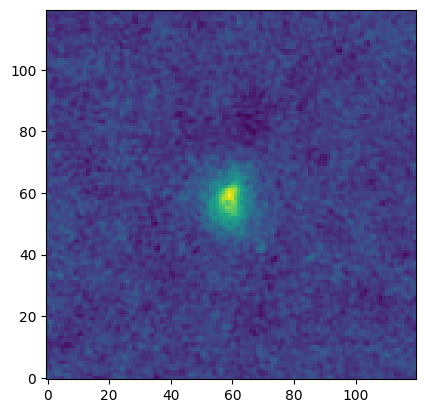

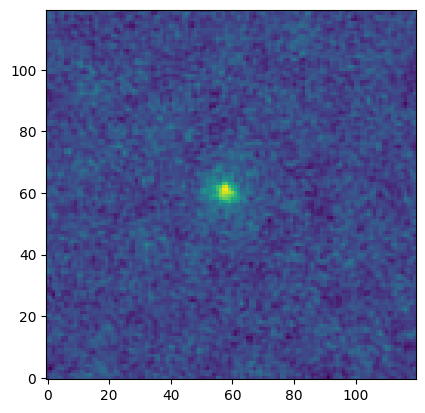

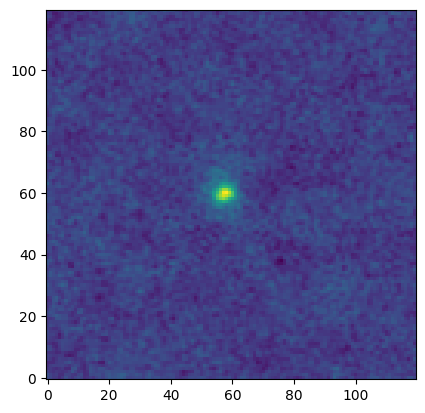

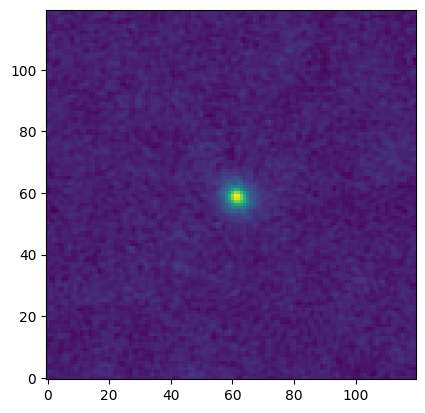

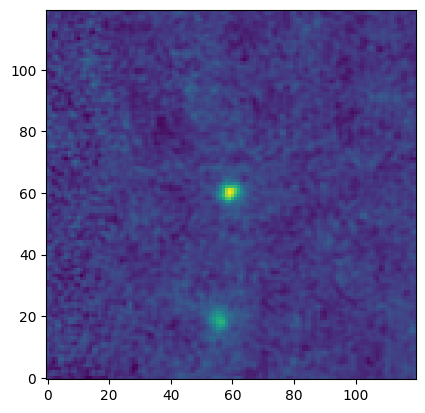

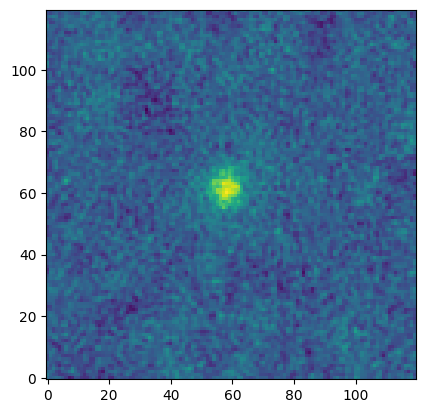

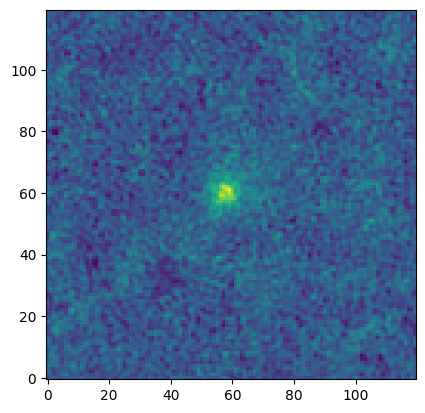

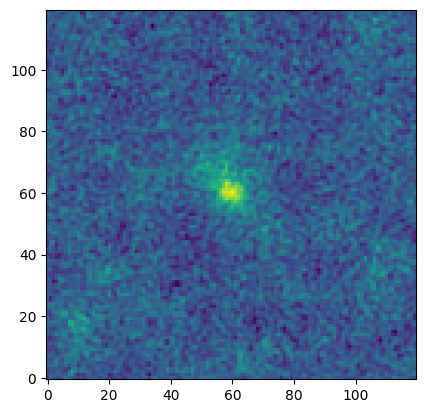

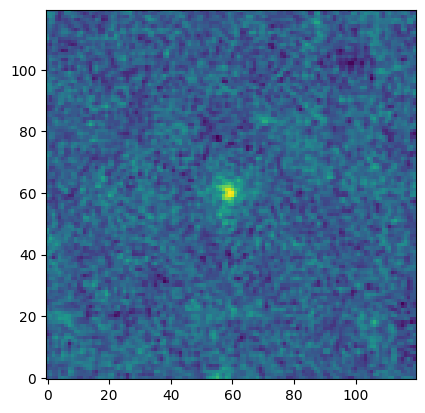

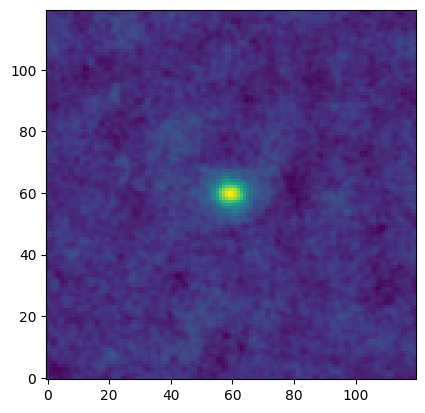

<Figure size 640x480 with 0 Axes>

In [ ]:
im_array = []
base_shape = (120,120) # choose a square shape to interpolate to
for patch in patches_1x1deg:
  # Interpolate images to new size using Pillow.Image
  pil_img    = Image.fromarray(patch)
  # plt.imshow(pil_img)
  pil_img_rs = pil_img.resize(base_shape)
  resized    = np.array(pil_img_rs.getdata()).reshape(pil_img_rs.size)
  plt.imshow(np.fliplr(resized), origin = 'lower') # plot with the same orientation as the above enmap plots
  plt.show()
  plt.clf()
  im_array.append(resized)
im_array = np.asarray(im_array)
stack_1x1deg = np.average(im_array, axis=0)


Text(0.5, 1.0, 'Cluster stack after rescaling and interpolation')

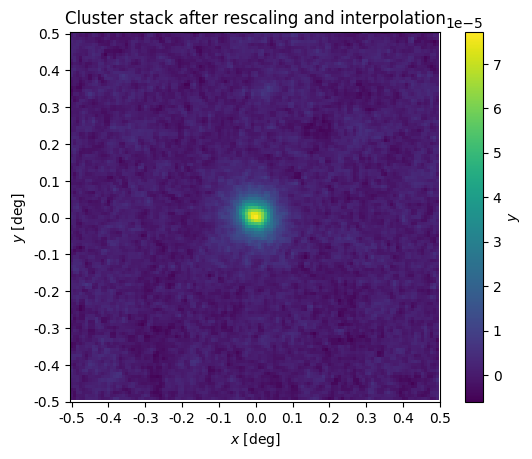

In [ ]:
# show the new stacked figure
fig, ax = plt.subplots()
ystack = ax.imshow(stack_1x1deg)

nticks = 11
ax.set_xticks(np.linspace(0, stack.shape[1],nticks))
ax.set_yticks(np.linspace(0, stack.shape[0],nticks))
ax.set_xticklabels("{:.1f}".format(tick) for tick in np.linspace(-patch_size/2., patch_size/2., nticks))
ax.set_yticklabels("{:.1f}".format(tick) for tick in np.linspace(patch_size/2., -patch_size/2., nticks))
ax.set_xlabel("$x$ [deg]")
ax.set_ylabel("$y$ [deg]")
plt.colorbar(ystack, label='$y$')
plt.title("Cluster stack after rescaling and interpolation")


Now, the stack looks much more symmetric. Let us see the profile in comparison to the map's 1.6' beam.

In [ ]:
# define a function to extract annuli
def get_annulus(image, r_in, r_out):

    '''
    Extract mean and std of image in annulus of radii (r_in, r_out)
    '''
    # creds: Huanian Zhang on Stackoverflow

    # define the image center
    # note that this works for images with odd npix but for even images the center is between two pixels
    # (but we don't care about that level of precision for this tutorial)
    center = [int(image.shape[0]//2), int(image.shape[1]//2)]
    # define the possible maximum pixels in y and x (i and j) axes for the annulus between r_in and r_out
    imin = center[0] - r_out
    imax = center[0] + r_out + 1
    jmin = center[1] - r_out
    jmax = center[1] + r_out + 1
    target = []
    for i in np.arange(imin, imax):
        for j in np.arange(jmin, jmax):
            ij = np.array([i,j])
            # get the distance of pixel from center
            dist = np.linalg.norm(ij - np.array(center))
            # if the distance is within the annulus, save the y value in that pixel
            if dist > r_in and dist <= r_out:
                target.append(image[i][j])
    target = np.array(target)
    return np.average(target), np.std(target)

Binning in annuli with width 1.000000 arcminutes
2 0
4 2
6 4
8 6
10 8
12 10
14 12
16 14
18 16
20 18
22 20
24 22
26 24
28 26
30 28
32 30
34 32
36 34
38 36
40 38
42 40
44 42
46 44
48 46
50 48
52 50
54 52
56 54
58 56


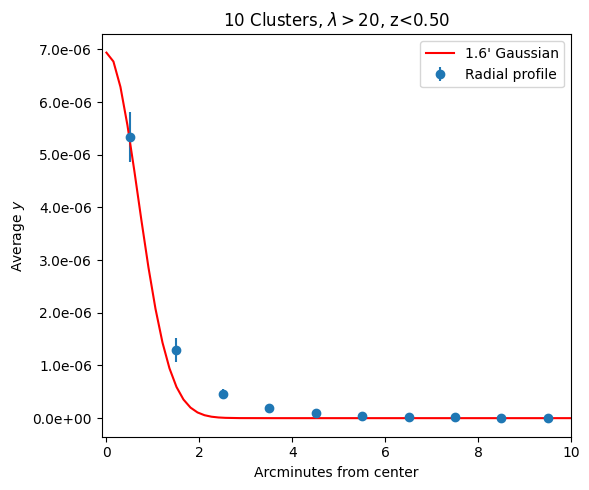

In [ ]:
# bin in annuli
# set the patch size and pixel size
patchsize_arcmin = patch_size*60
pixwidth_arcmin  = patch_size*60/stack_1x1deg.shape[0]
pix_bin = 2 # arbitrary choice of binning; increase this to bin more pixels together
print("Binning in annuli with width %f arcminutes" %(pix_bin * pixwidth_arcmin))
nbins = int(stack_1x1deg.shape[0]//2//pix_bin)

sums_stack = []
errs_stack = []
bin_cents = []

for i in range(0, nbins-1): # moving out from the center in bin sizes of r_bin
    r_in = pix_bin * (i)
    r_out = r_in + pix_bin # outer radius of annulus
    print(r_out, r_in)
    bin_cent = (r_in+r_out)/2.
    tot, err = get_annulus(stack_1x1deg, r_in, r_out)
    ann_area = np.pi*(r_out**2 - r_in**2)
    i_per_a = tot/ann_area # intensity per unit area on image
    sums_stack.append(i_per_a)
    bin_cents.append(bin_cent)
    errs_stack.append(err/ann_area)
errs_stack = np.asarray(errs_stack)
sums_stack = np.asarray(sums_stack)

# plot the result
fig,ax = plt.subplots(figsize=[6,5])
ax.errorbar(np.asarray(bin_cents) * pixwidth_arcmin,sums_stack, yerr=errs_stack, label='Radial profile', fmt='o')
ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.1e'))
ax.set_xlabel("Arcminutes from center")
ax.set_ylabel("Average $y$")
ax.set_title("%d Clusters, $\lambda>%.0f$, z<%.2f" %(Ncl_stack, min_rich, maxz))

# plot a gaussian also
xaxis_pix = np.linspace(0, stack.shape[0]//2, 200)
xaxis_arcmin = xaxis_pix * pixwidth_arcmin
sigma = 1.6/(2*np.sqrt(2 * np.log(2))) # beam in arcmin
amplitude = sums_stack[0]*1.3 # can fiddle with this by hand to try to get a matching profile
g = amplitude * np.exp(-(xaxis_arcmin)**2/(2*sigma**2))
ax.plot(xaxis_arcmin, g, 'r', label='1.6\' Gaussian')
ax.legend()
ax.set_xlim([-.1,10])
plt.tight_layout()

You can try to fiddle with the profile binning and the Gaussian amplitude, but will find it difficult to fit this profile with a Gaussian. Due to this, we can see that the profile of the stacked clusters extends further than the Gaussian profile, showing that there is structure beyond the resolution of the ACT map.

So far, we have been combining clusters at quite different redshifts but neglecting how redshift impacts their angular size on the sky. Depending on the science case, we may want to rescale them to the same physical or comoving size.

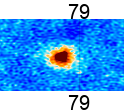

area in steradians 0.00010966150351388994
Size in pixels: 8928


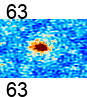

area in steradians 7.218558572107334e-05
Size in pixels: 5133


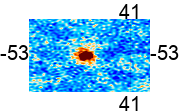

area in steradians 0.00011236368181375035
Size in pixels: 8833


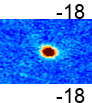

area in steradians 9.018775251091466e-05
Size in pixels: 5980


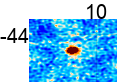

area in steradians 8.417241483374676e-05
Size in pixels: 5544


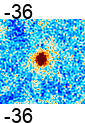

area in steradians 0.00015279096299454528
Size in pixels: 7225


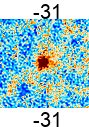

area in steradians 0.00016751073053615257
Size in pixels: 7921


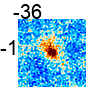

area in steradians 9.779908407895376e-05
Size in pixels: 4624


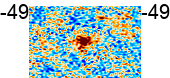

area in steradians 0.00011130401004190155
Size in pixels: 8064


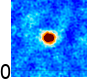

area in steradians 0.00012379114705736438
Size in pixels: 5852


In [ ]:
# Find the size in degree that corresponds to same physical size per redshift

import astropy.units as u
from astropy.cosmology import Planck18 as cosmo
from astropy.cosmology import z_at_value
L_Mpc = 10 # desired side length of each cutout in physical Mpc
# make an array of desired cutout sizes in degrees per cluster, corresponding to 10 Mpc at the cluster's redshift
patch_size = (cosmo.arcsec_per_kpc_proper(z_masked).to(u.deg/u.Mpc))*L_Mpc*u.Mpc

patches_10x10Mpc = []
Ncl_stack = 10
for i in range(Ncl_stack):
  ra_i = ra_masked[i]*utils.degree # to radians
  dec_i = dec_masked[i] * utils.degree
  radius_ra  = patch_size[i].value/2. * utils.degree / np.cos(dec_i) # account for narrowing ra with off-equator declination
  radius_dec = patch_size[i].value/2. * utils.degree
  # Next we create our submap by defining a box in coordinate space
  imap_sub = ymap.submap([[dec_i - radius_dec, ra_i - radius_ra], [dec_i + radius_dec, ra_i + radius_ra]])
  # Visualize the map cutout
  plot = enplot.plot(imap_sub)
  enplot.show(plot)
  patches_10x10Mpc.append(imap_sub)
  # check the area in steradians of of the submap
  print("area in steradians", enmap.area(imap_sub.shape, imap_sub.wcs))
  print("Size in pixels:", imap_sub.size)

The patches are all different sizes again, so we need to do some rescaling, as before.

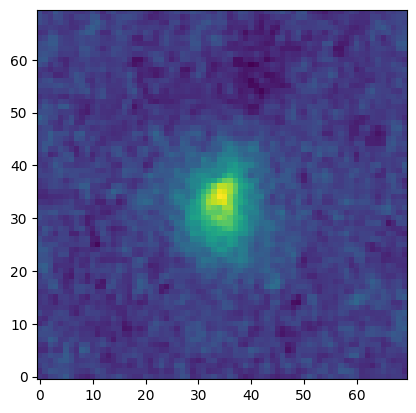

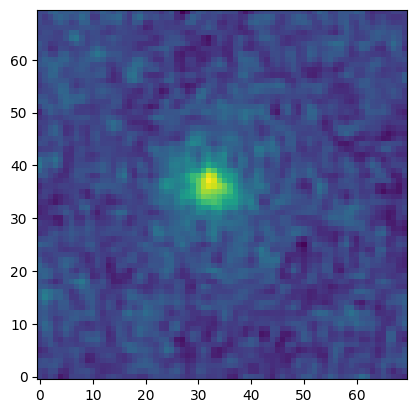

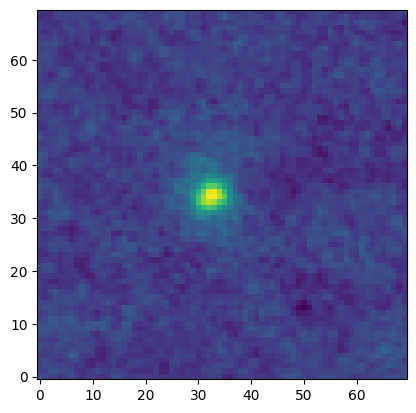

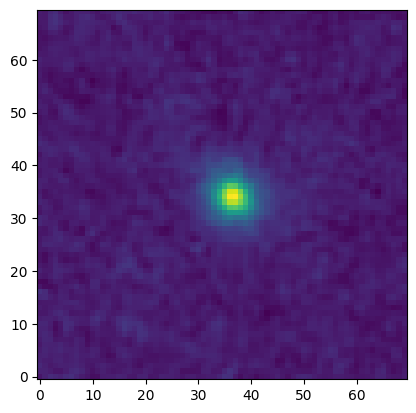

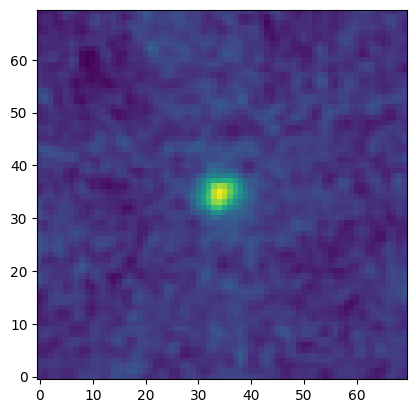

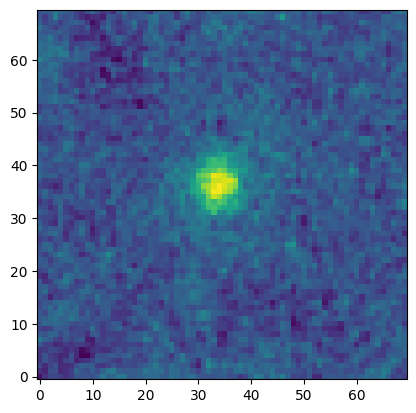

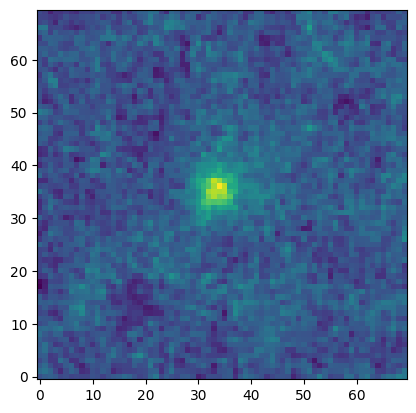

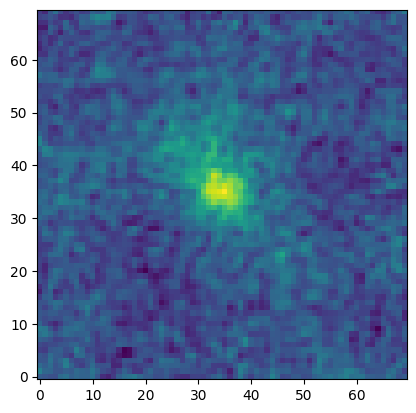

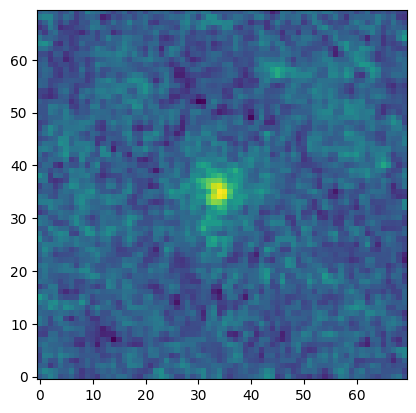

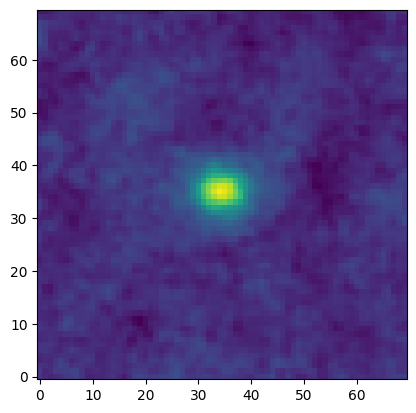

<Figure size 640x480 with 0 Axes>

In [ ]:
im_array = []
base_shape = (70,70) # choose a square shape to interpolate to
for patch in patches_10x10Mpc:
  # Interpolate images to new size using Pillow.Image
  pil_img    = Image.fromarray(patch)
  # plt.imshow(pil_img)
  pil_img_rs = pil_img.resize(base_shape)
  resized    = np.array(pil_img_rs.getdata()).reshape(pil_img_rs.size)
  plt.imshow(np.fliplr(resized), origin = 'lower') # plot with the same orientation as the above enmap plots
  plt.show()
  plt.clf()
  im_array.append(resized)
im_array = np.asarray(im_array)
stack_interp = np.average(im_array, axis=0)

Text(0.5, 1.0, 'Constant-physical-size stack')

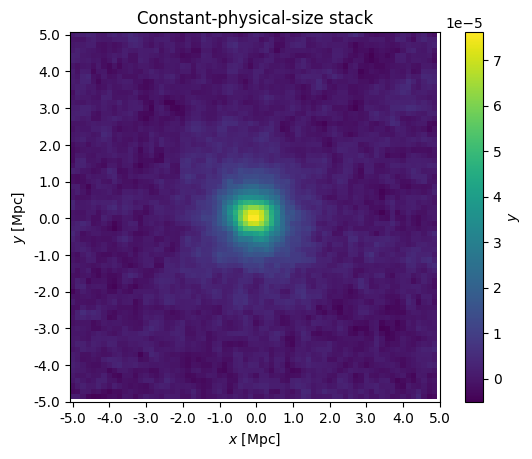

In [ ]:
# show the stacked figure which has constant physical size
fig, ax = plt.subplots()
ystack2 = ax.imshow(stack_interp)
nticks = 11

ax.set_xticks(np.linspace(0, stack_interp.shape[1],nticks))
ax.set_yticks(np.linspace(0, stack_interp.shape[0],nticks))
ax.set_xticklabels("{:.1f}".format(tick) for tick in np.linspace(-L_Mpc/2., L_Mpc/2., nticks))
ax.set_yticklabels("{:.1f}".format(tick) for tick in np.linspace(L_Mpc/2., -L_Mpc/2., nticks))
ax.set_xlabel("$x$ [Mpc]")
ax.set_ylabel("$y$ [Mpc]")
plt.colorbar(ystack2, label='$y$')
plt.title("Constant-physical-size stack")

Next, let's look at the profile of these stacked clusters.

Binning in annuli with width 0.285714 Mpc
2 0
4 2
6 4
8 6
10 8
12 10
14 12
16 14
18 16
20 18
22 20
24 22
26 24
28 26
30 28
32 30


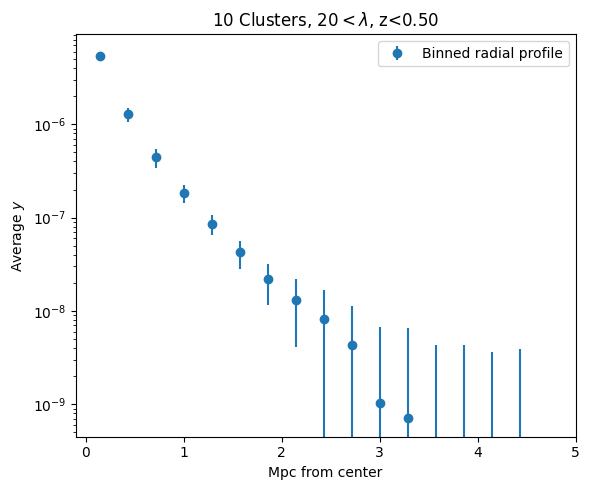

In [ ]:
# bin in annuli

pixwidth_Mpc  = L_Mpc/stack_interp.shape[0] # pixheight is the same, since we made our base shape square
pix_bin = 2
print("Binning in annuli with width %f Mpc" %(pix_bin * pixwidth_Mpc))
nbins = int(stack_interp.shape[0]//2//pix_bin)
sums_stack = []
errs_stack = []
bin_cents = []
for i in range(0, nbins-1): #moving out from the center in bin sizes of r_bin
    r_in = pix_bin * (i)
    r_out = r_in + pix_bin #outer radius of annulus
    print(r_out, r_in)
    bin_cent = (r_in+r_out)/2.
    tot, err = get_annulus(stack_interp, r_in, r_out)
    ann_area = np.pi*(r_out**2 - r_in**2)
    i_per_a = tot/ann_area #intensity per unit area on image
    sums_stack.append(i_per_a)
    bin_cents.append(bin_cent)
    errs_stack.append(err/ann_area)
errs_stack = np.asarray(errs_stack)
sums_stack = np.asarray(sums_stack)
fig,ax = plt.subplots(figsize=[6,5])
ax.errorbar(np.asarray(bin_cents) * pixwidth_Mpc,sums_stack, yerr=errs_stack, label='Binned radial profile', fmt='o')

ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.1e'))
ax.set_xlabel("Mpc from center")
ax.set_ylabel("Average $y$")
ax.set_title("%d Clusters, $%d<\lambda$, z<%.2f" %(Ncl_stack, min_rich, maxz))

# plot a gaussian also

xaxis_pix = np.linspace(0, stack_interp.shape[0]//2, 200)
xaxis_Mpc = xaxis_pix * pixwidth_Mpc
ax.legend()
ax.set_xlim([-.1,5])
plt.yscale('log')
plt.tight_layout()


We plot the profile in log-y because it declines so rapidly from the center.

Now, let's compare the signal-to-noise in the stacked image with that of a few individual images.

Noise in stack is on average 0.41 times that of the individual images. We expect 0.32


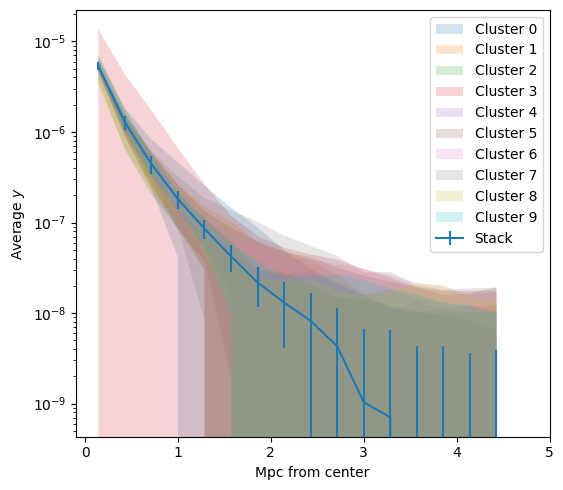

In [ ]:
fig,ax = plt.subplots(figsize=[6,5])

noise_ratio = []
# find the profile (with uncertainties) for each different cluster cutout, so that we can compare it to the profile of the stacked image
for c, img in enumerate(im_array): # use the resized images
  sums = []
  errs = []
  bin_cents = []
  for i in range(0, nbins-1): #moving out from the center in bin sizes of r_bin
      r_in = pix_bin * (i)
      r_out = r_in + pix_bin #outer radius of annulus
      bin_cent = (r_in+r_out)/2.
      tot, err = get_annulus(img, r_in, r_out)
      ann_area = np.pi*(r_out**2 - r_in**2)
      i_per_a = tot/ann_area #intensity per unit area on image
      sums.append(i_per_a)
      bin_cents.append(bin_cent)
      errs.append(err/ann_area)
  sums = np.asarray(sums)
  errs = np.asarray(errs)
  noise_ratio.append(np.average(errs_stack/errs))
  ax.fill_between(np.asarray(bin_cents) * pixwidth_Mpc,sums_stack-errs, sums+errs, label=f'Cluster {c}', alpha = 0.2)
  ax.set_xlabel("Mpc from center")
  ax.set_ylabel("Average $y$")

ax.errorbar(np.asarray(bin_cents) * pixwidth_Mpc,sums_stack, yerr=errs_stack, label='Stack')
ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.1e'))

ax.legend()
ax.set_xlim([-.1,5])
plt.tight_layout()
plt.yscale('log')

print("Noise in stack is on average {:.2f} times that of the individual images. We expect {:.2f}".format(np.average(noise_ratio), 1/np.sqrt(Ncl_stack)))

With a larger number of clusters stacked, and more similar masses/richnesses, the expected $\sqrt{N}$ behavior will more accurately predict the true signal-to-noise scaling.

Stacks like this can be used to measure cluster (or galaxy) profiles in different mass ranges, environments, etc so that we can learn more about the intracluster medium as well as the gas beyond halos. However, note that contamination from the cosmic infrared background (CIB) is important to consider in such studies, as it is correlated with clusters and galaxies, and can bias the results from tSZ! See our CIB notebook, ACT_DR6_ymap_CIB, available in the same notebook directory, for more information on how to measure and mitigate CIB impacts in your analysis.

**For More Information**

More examples of how to use Pixell and the ACT data products can be found in the [ACT DR4 and DR5 Notebooks](https://github.com/ACTCollaboration/DR4_DR5_Notebooks/tree/master), Pixell itself can be found [here](https://github.com/simonsobs/pixell/tree/master) and the full list of public ACT data is on [LAMBDA](https://lambda.gsfc.nasa.gov/product/act/).